In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data=pd.read_csv('nTop_ASME_Hackathon_Data-Expanded Dataset.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 890 entries, 0 to 889
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   AvgVelocity     890 non-null    float64
 1   Mass            890 non-null    float64
 2   PressureDrop    890 non-null    float64
 3   Surface Area    890 non-null    float64
 4   Velocity Inlet  890 non-null    float64
 5   X Cell Size     890 non-null    float64
 6   YZ Cell Size    890 non-null    float64
 7   Reynolds        890 non-null    float64
dtypes: float64(8)
memory usage: 55.8 KB


In [4]:
data.head()

,AvgVelocity,Mass,PressureDrop,Surface Area,Velocity Inlet,X Cell Size,YZ Cell Size,Reynolds
0,564.403162,129.898274,6070.294679,25202.68663,3214.285714,25.00,15.357143,28680.71078
1,515.131699,137.284307,5845.135436,30699.75682,3071.428571,25.00,11.071429,22247.77408
2,561.464698,131.362414,7109.120861,27334.16304,2500.000000,10.00,22.857143,20253.37921
3,563.572922,129.658551,7376.613184,26207.80935,2714.285714,13.75,20.714286,23996.27624
4,636.241718,124.498871,8013.822800,22671.54383,3500.000000,25.00,19.642857,34832.16203


# Primary Exploratory data analysis-EDA
Using EDA, we try to determine the relationship between features and target variables in the dataset. Before fitting any ML algorithms, this helps us improve our understanding of the features and target variables. This would further help us choose a more compatible algorithm for the dataset. Also, this would help us enhance the dimension of our dataset, especially for physics-informed features.

## Identify features and targets



In [5]:
# Define features and targets
features = ['X Cell Size', 'YZ Cell Size', 'Velocity Inlet']
targets  = [c for c in data.columns if c not in features]

## Visualize feature distributions
Generate plots to visualize the distributions of the feature columns.


**Reasoning**:
This would improve our understanding of the data distribution in the dataset and help us determine any outliers available in the data.


In [7]:
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.size': 10,
    'axes.labelsize': 10,
    'axes.titlesize': 10,
    'legend.fontsize': 8,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'axes.linewidth': 1.2,
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'axes.labelcolor': 'black',
    'axes.edgecolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black',
    'text.color': 'black',
})

plasma_cmap = plt.cm.plasma
plasma_targets = sns.color_palette("plasma", len(targets))
plasma_features = sns.color_palette("plasma", len(features))

# --- Auto-units mapping + patch ---
import re
from matplotlib import pyplot as _plt

FIELD_UNITS = {
    "AvgVelocity":       "(mm/s)",
    "Mass":              "(g)",
    "PressureDrop":      "(Pa)",
    "Surface Area":      "(mm^2)",
    "Velocity Inlet":    "(mm/s)",
    "X Cell Size":       "(mm)",
    "YZ Cell Size":      "(mm)",
    "Reynolds":          "",
}


_UNIT_TAIL_RE = re.compile(r"\s*\([^()]*\)\s*$")

def _strip_units(s: str) -> str:
    return _UNIT_TAIL_RE.sub("", s).strip()

def display_name(name: str) -> str:
    base = _strip_units(name)
    unit = FIELD_UNITS.get(base, "")
    return f"{base} {unit}".strip()

def title_with_units(title: str) -> str:
    out = title
    for base, unit in FIELD_UNITS.items():
        if not unit:

            out = re.sub(rf"\b{re.escape(base)}\b(?!\s*\()", base, out)
        else:
            out = re.sub(rf"\b{re.escape(base)}\b(?!\s*\()", f"{base} {unit}", out)
    return out

_orig_set_xlabel = _plt.Axes.set_xlabel
_orig_set_ylabel = _plt.Axes.set_ylabel
_orig_set_title  = _plt.Axes.set_title

def _set_xlabel_units(self, xlabel, *a, **k):
    if isinstance(xlabel, str):
        xlabel = display_name(xlabel)
    return _orig_set_xlabel(self, xlabel, *a, **k)

def _set_ylabel_units(self, ylabel, *a, **k):
    if isinstance(ylabel, str):
        ylabel = display_name(ylabel)
    return _orig_set_ylabel(self, ylabel, *a, **k)

def _set_title_units(self, title, *a, **k):
    if isinstance(title, str):
        title = title_with_units(title)
    return _orig_set_title(self, title, *a, **k)

plt.Axes.set_xlabel = _set_xlabel_units
plt.Axes.set_ylabel = _set_ylabel_units
plt.Axes.set_title  = _set_title_units


def relabel_current_figure(fig=None):
    fig = fig or plt.gcf()
    for ax in fig.axes:
        ax.set_xlabel(ax.get_xlabel())
        ax.set_ylabel(ax.get_ylabel())
        ax.set_title(ax.get_title())
    fig.canvas.draw_idle()

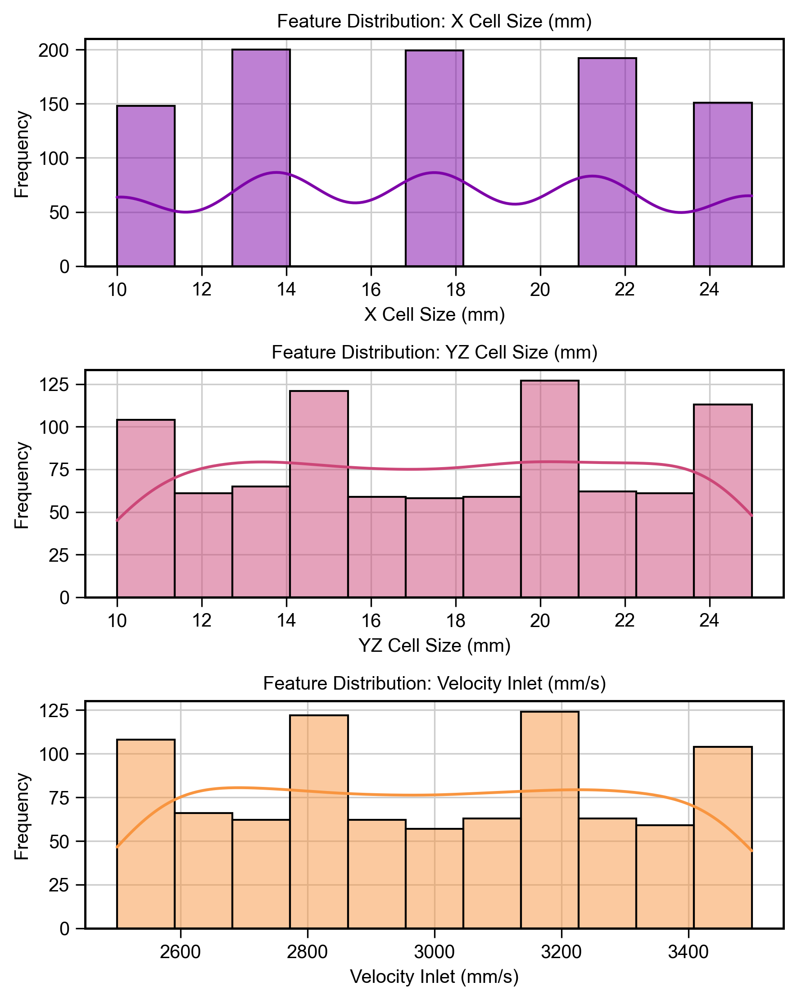

In [8]:
fig_f, axes_f = plt.subplots(nrows=len(features), ncols=1, figsize=(6, 2.5*len(features)))
for i, col in enumerate(features):
    sns.histplot(
        data=data,
        x=col,
        kde=True,
        color=plasma_features[i],
        ax=axes_f[i],
        edgecolor="black"
    )
    axes_f[i].set_title(f"Feature Distribution: {col}")
    axes_f[i].set_xlabel(col)
    axes_f[i].set_ylabel("Frequency")
fig_f.tight_layout()
plt.show()


## Visualize target distributions.


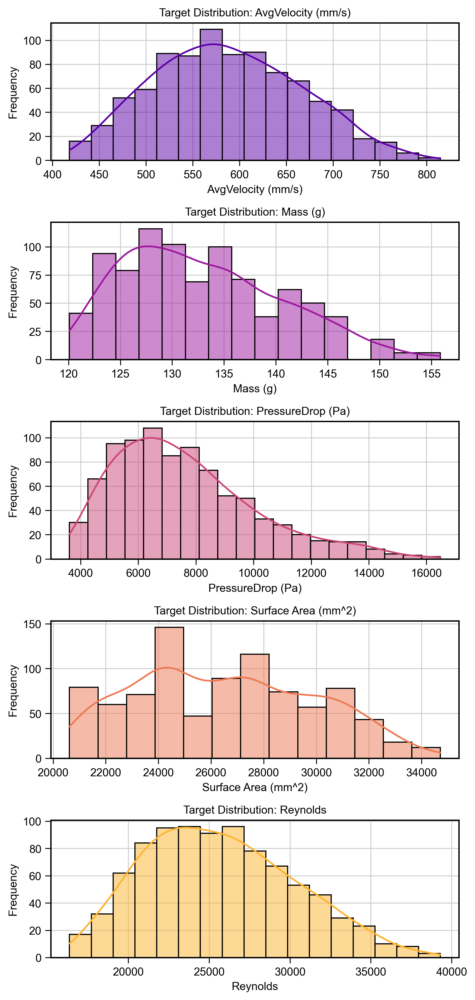

In [9]:
fig_t, axes_t = plt.subplots(nrows=len(targets), ncols=1, figsize=(6, 2.5*len(targets)))
for i, col in enumerate(targets):
    sns.histplot(
        data=data,
        x=col,
        kde=True,
        color=plasma_targets[i],
        ax=axes_t[i],
        edgecolor="black"
    )
    axes_t[i].set_title(f"Target Distribution: {col}")
    axes_t[i].set_xlabel(col)
    axes_t[i].set_ylabel("Frequency")
fig_t.tight_layout()
plt.show()

## Visualize relationships between features and targets


**Reasoning**:
Generate scatter plots to visualize the relationships between each feature and each target variable. This would further improve our understadning on the effect of features on each other and target. Therfore, we could understand which feauture has the most impact on targets



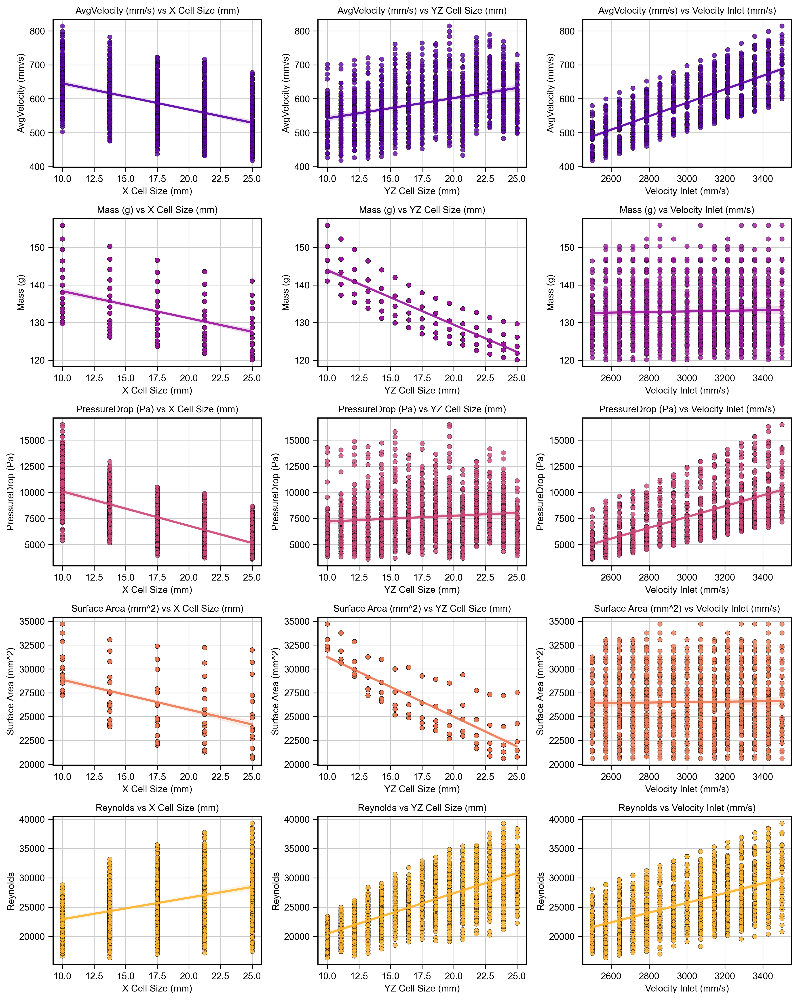

In [10]:
n_rows, n_cols = len(targets), len(features)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), squeeze=False)

for r, tgt in enumerate(targets):
    for c, feat in enumerate(features):
        ax = axes[r][c]
        color = plasma_targets[r]
        sns.regplot(
            data=data, x=feat, y=tgt,
            scatter_kws=dict(s=25, edgecolor='black', linewidths=0.3, alpha=0.8),  
            line_kws=dict(alpha=0.9),
            color=color, ax=ax, lowess=False
        )
        ax.set_title(f'{tgt} vs {feat}')
        ax.set_xlabel(feat)
        ax.set_ylabel(tgt)

fig.tight_layout()
plt.show()

## Correlation Matrix
**Reasoning:**This analysis would further help us to determine the correlation between features and targets, which is necessary for future analysis.

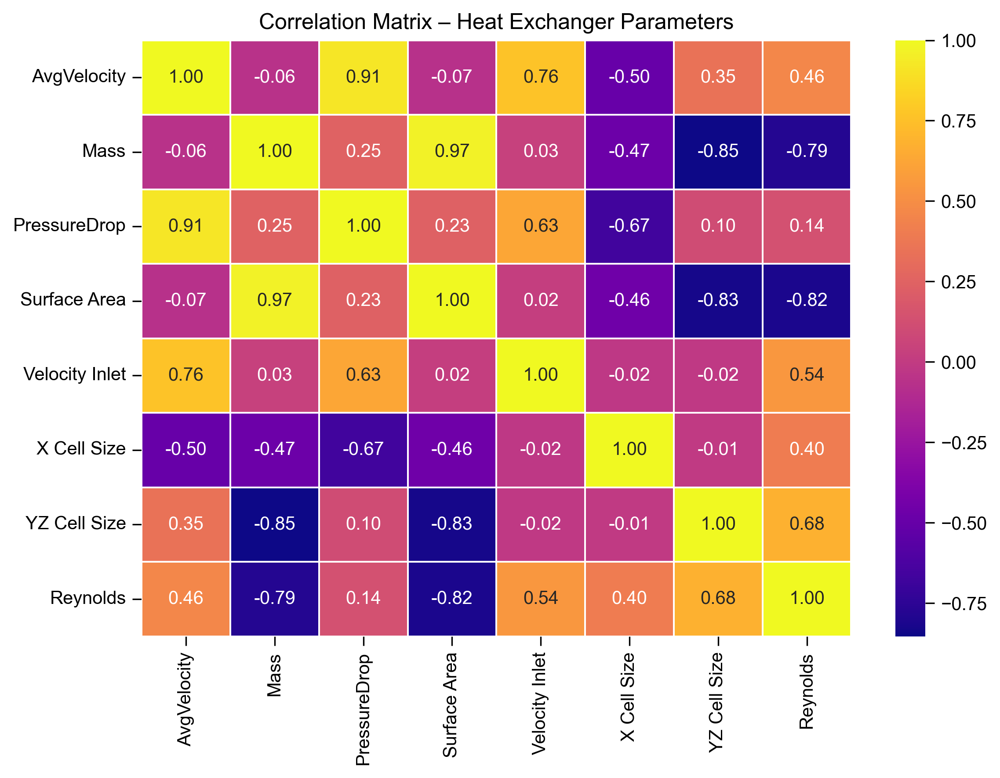

In [11]:
import numpy as np

# Compute correlation matrix
corr = data.corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr,
    annot=True, fmt=".2f",
    cmap="plasma",
    cbar=True,
    linewidths=0.5,
    linecolor='white'
)
plt.title("Correlation Matrix – Heat Exchanger Parameters", fontsize=12)
plt.tight_layout()
plt.show()

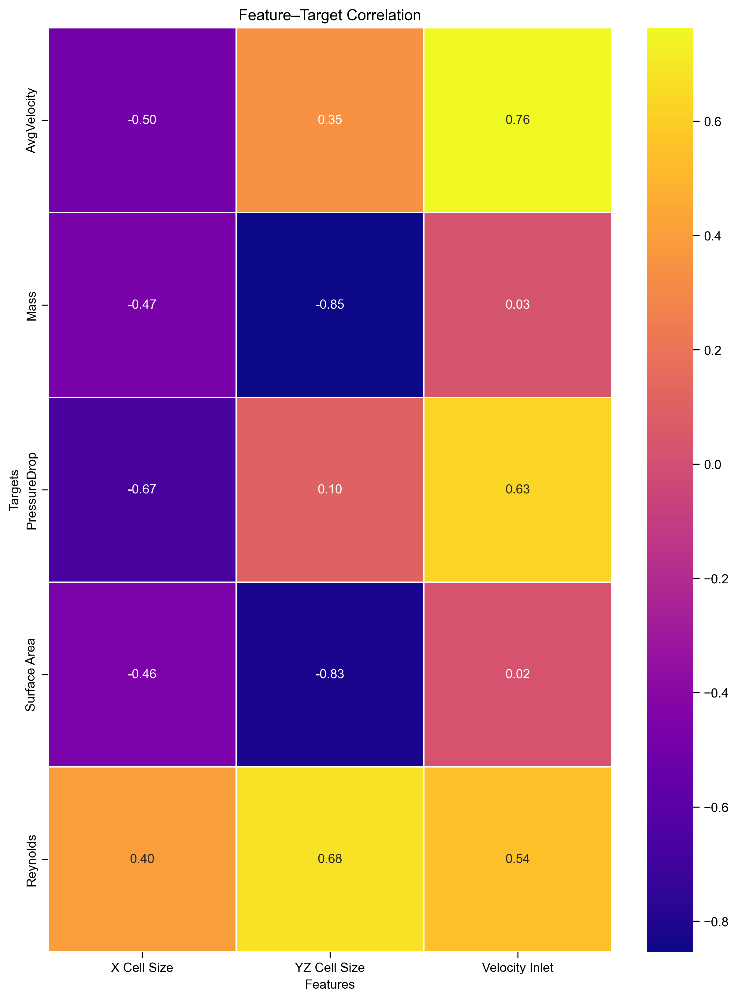

In [12]:
corr_ft = corr.loc[targets, features]

plt.figure(figsize=(1.8*len(features)+3, 1.8*len(targets)+2))
sns.heatmap(
    corr_ft,
    annot=True, fmt=".2f",
    cmap='plasma',
    cbar=True,
    linewidths=0.5, linecolor='white'
)
plt.title("Feature–Target Correlation", fontsize=12)
plt.xlabel("Features")
plt.ylabel("Targets")
plt.tight_layout()
plt.show()

##Trade-off plots
These expose competing objectives (e.g., high surface area often increases pressure drop or mass), guiding where feasible, high-performing designs may exist in multi-objective space.

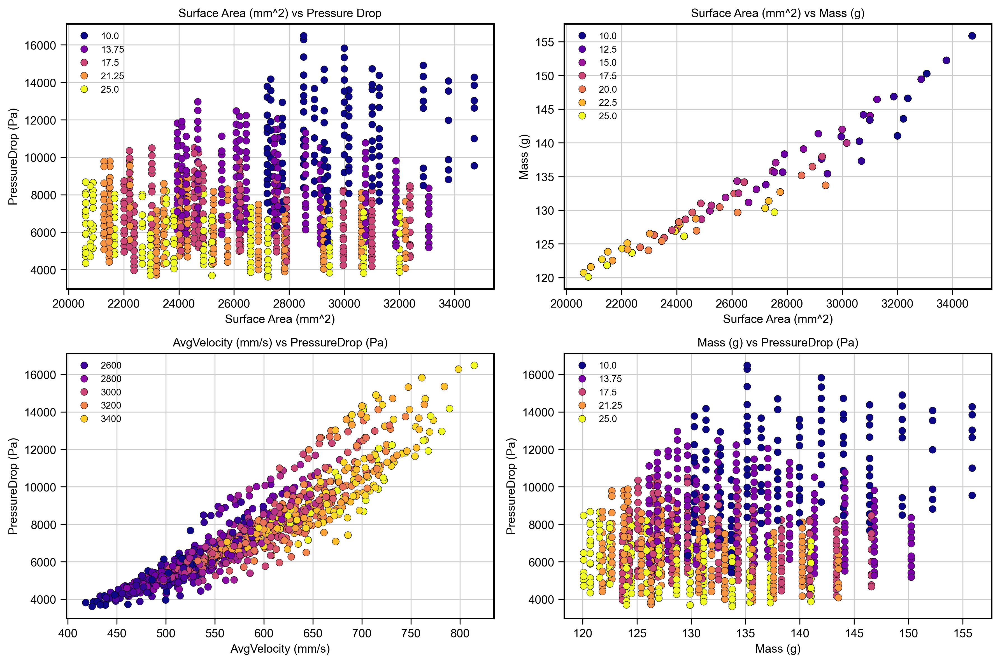

In [13]:
plt.figure(figsize=(12, 8))
plt.subplot(2,2,1)
sns.scatterplot(data=data, x='Surface Area', y='PressureDrop', hue='X Cell Size', palette='plasma',
                edgecolor='black', linewidths=0.3)
plt.title('Surface Area vs Pressure Drop'); plt.legend(fontsize=8)

plt.subplot(2,2,2)
sns.scatterplot(data=data, x='Surface Area', y='Mass', hue='YZ Cell Size', palette='plasma',
                edgecolor='black', linewidths=0.3)
plt.title('Surface Area vs Mass'); plt.legend(fontsize=8)

plt.subplot(2,2,3)
sns.scatterplot(data=data, x='AvgVelocity', y='PressureDrop', hue='Velocity Inlet', palette='plasma',
                edgecolor='black', linewidths=0.3)
plt.title('AvgVelocity vs PressureDrop'); plt.legend(fontsize=8)

plt.subplot(2,2,4)
sns.scatterplot(data=data, x='Mass', y='PressureDrop', hue='X Cell Size', palette='plasma',
                edgecolor='black', linewidths=0.3)
plt.title('Mass vs PressureDrop'); plt.legend(fontsize=8)

plt.tight_layout(); plt.show()

## Feasibility Plots
We could bound the acceptable and feasible design using these plots according to the problem statement.

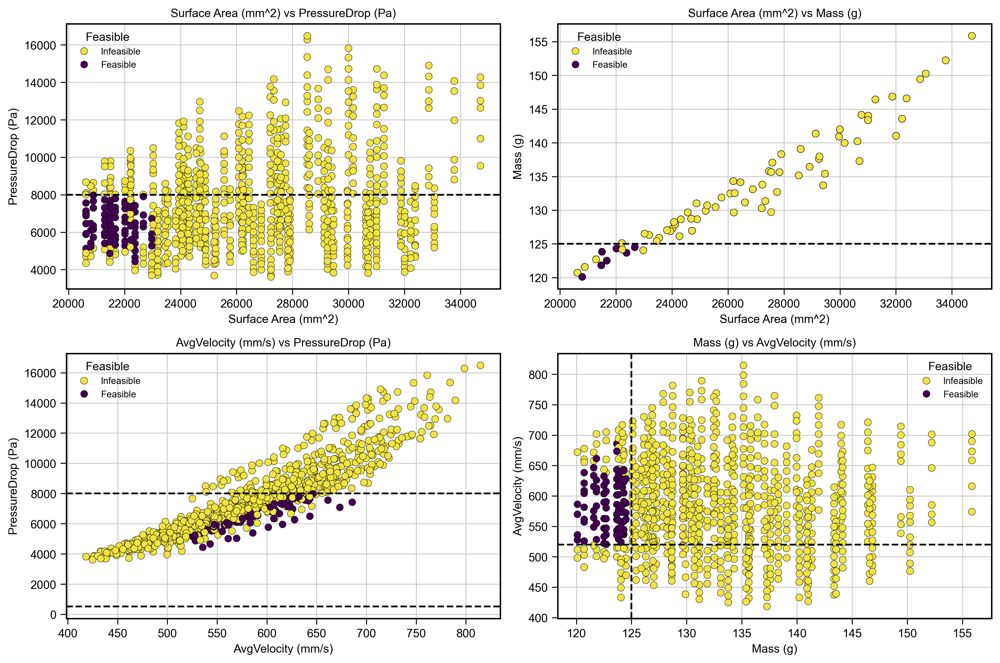

In [14]:
# Constraints
mass_thr = 125.0
dp_thr   = 8000.0
u_thr    = 520.0

# Feasibility
feasible = (data['Mass'] < mass_thr) & (data['PressureDrop'] < dp_thr) & (data['AvgVelocity'] > u_thr)
data['Feasible'] = np.where(feasible, 'Feasible', 'Infeasible')

plt.figure(figsize=(12, 8))
plt.subplot(2,2,1)
sns.scatterplot(data=data, x='Surface Area', y='PressureDrop', hue='Feasible', palette={'Feasible':'#440154','Infeasible':'#F0E442'},
                edgecolor='black', linewidths=0.3)
plt.axhline(dp_thr, ls='--', color='black'); plt.title('Surface Area vs PressureDrop')

plt.subplot(2,2,2)
sns.scatterplot(data=data, x='Surface Area', y='Mass', hue='Feasible', palette={'Feasible':'#440154','Infeasible':'#F0E442'},
                edgecolor='black', linewidths=0.3)
plt.axhline(mass_thr, ls='--', color='black'); plt.title('Surface Area vs Mass')

plt.subplot(2,2,3)
sns.scatterplot(data=data, x='AvgVelocity', y='PressureDrop', hue='Feasible', palette={'Feasible':'#440154','Infeasible':'#F0E442'},
                edgecolor='black', linewidths=0.3)
plt.axhline(u_thr, ls='--', color='black'); plt.axhline(dp_thr, ls='--', color='black')
plt.title('AvgVelocity vs PressureDrop')

plt.subplot(2,2,4)
sns.scatterplot(data=data, x='Mass', y='AvgVelocity', hue='Feasible', palette={'Feasible':'#440154','Infeasible':'#F0E442'},
                edgecolor='black', linewidths=0.3)
plt.axvline(mass_thr, ls='--', color='black'); plt.axhline(u_thr, ls='--', color='black')
plt.title('Mass vs AvgVelocity')

plt.tight_layout(); plt.show()


## Permutation
This plot quantifies each input’s influence on targets while capturing non-linearities, complementing correlation analysis for physics-grounded sensitivity insights.

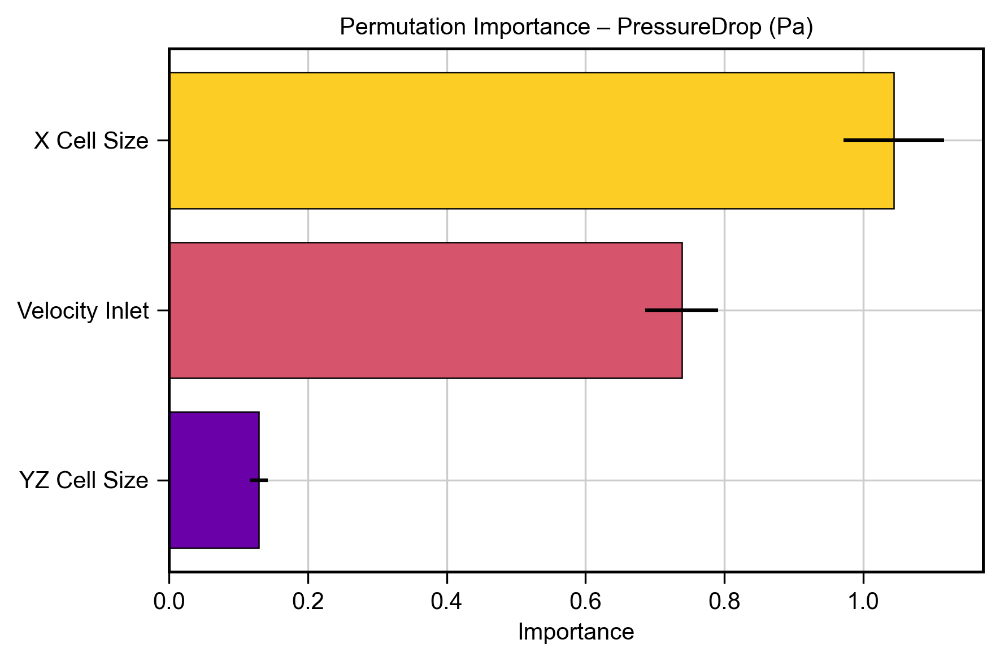

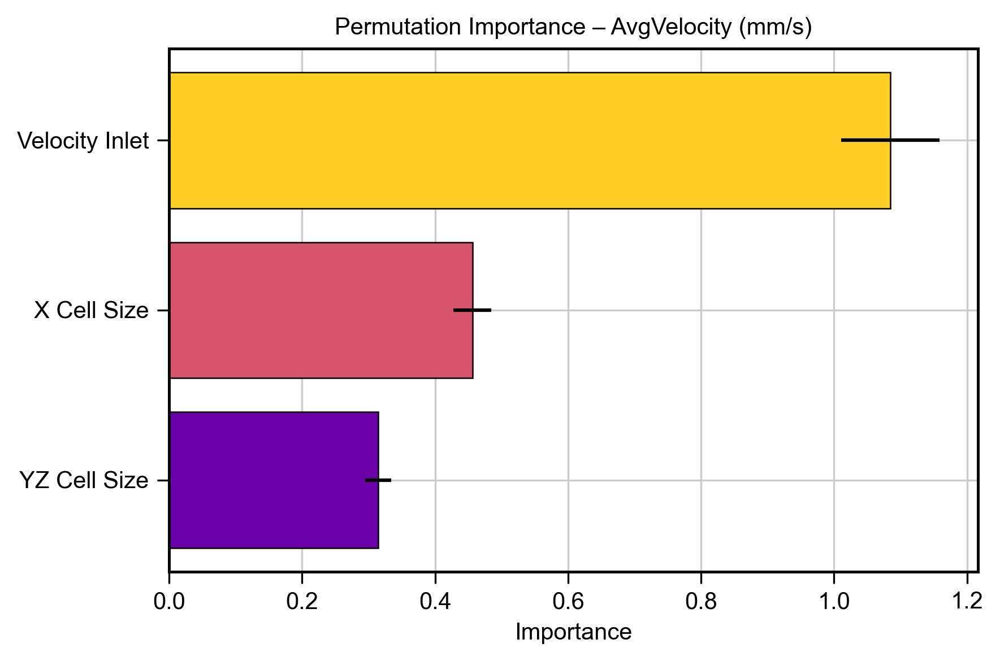

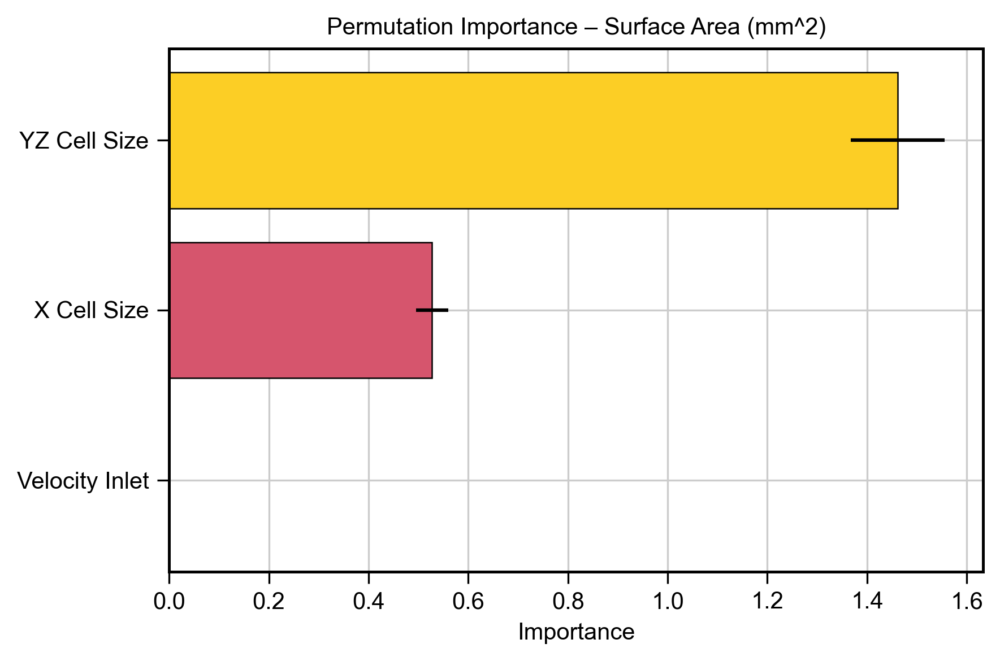

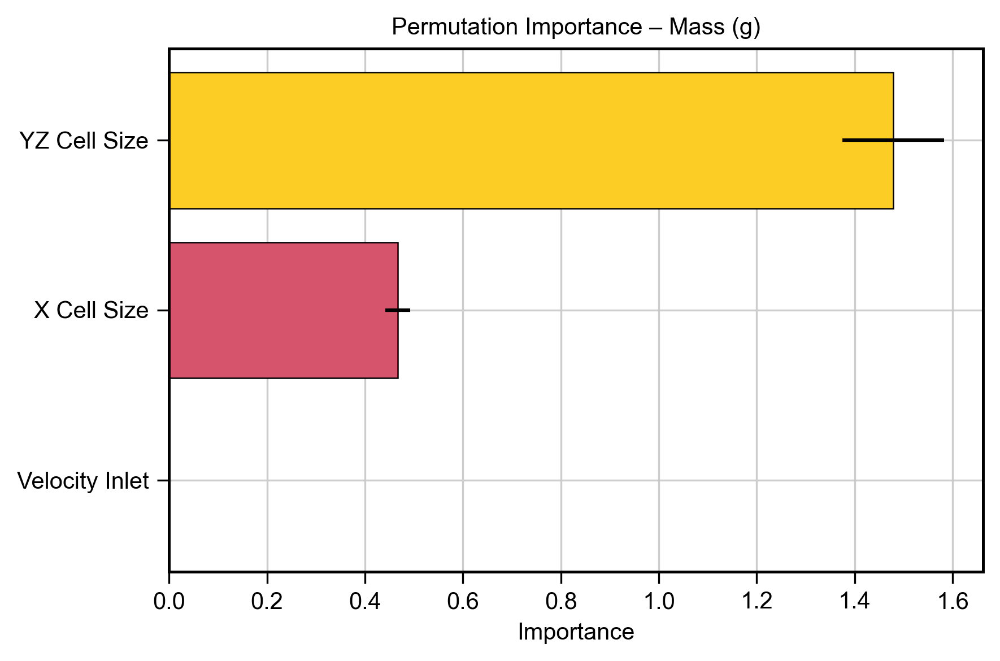

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

X = data[['X Cell Size', 'YZ Cell Size', 'Velocity Inlet']]
Y_targets = ['PressureDrop', 'AvgVelocity', 'Surface Area', 'Mass']

cmap = plt.cm.plasma  

for tgt in Y_targets:
    y = data[tgt].values
    Xtr, Xte, ytr, yte = train_test_split(X, y, test_size=0.30, random_state=42)
    rf = RandomForestRegressor(n_estimators=300, random_state=42)
    rf.fit(Xtr, ytr)

    perm = permutation_importance(rf, Xte, yte, n_repeats=20, random_state=42)
    imp_mean = perm.importances_mean
    imp_std  = perm.importances_std


    order = np.argsort(imp_mean)
    labels = X.columns[order]
    vals   = imp_mean[order]
    errs   = imp_std[order]

    
    colors = [cmap(v) for v in np.linspace(0.2, 0.9, len(labels))]

    plt.figure(figsize=(6, 4))
    plt.barh(range(len(labels)), vals, xerr=errs, color=colors,
             edgecolor='black', linewidth=0.6)
    plt.yticks(range(len(labels)), labels)
    plt.xlabel('Importance (mean decrease in score)')
    plt.title(f'Permutation Importance – {tgt}')
    plt.tight_layout()
    plt.show()

# ML Models Setup + Training and Evluation


Add Necessary libraries.

In [16]:
from sklearn.model_selection import RepeatedKFold, cross_validate
from sklearn.utils import parallel_backend
from sklearn.base import clone
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import train_test_split
import pickle
import time
import seaborn as sns
from math import ceil
from joblib import parallel_backend
from sklearn.neural_network import MLPRegressor

## Evaluation Matrix
The defined framwork would help us to centralize evaluation and visualization to keep the pipeline clean and comparable across models.

In [17]:
try:
    data, features, targets
except NameError:
    features = ['X Cell Size', 'YZ Cell Size', 'Velocity Inlet']
    targets  = [c for c in data.columns if c not in features]

required_feats = set(['X Cell Size', 'YZ Cell Size', 'Velocity Inlet'])
required_tgts  = set(['PressureDrop', 'AvgVelocity', 'Surface Area', 'Mass'])
assert required_feats.issubset(set(features)), \
    f"Missing required features in features list: {required_feats - set(features)}"
assert required_tgts.issubset(set(targets)), \
    f"Missing required targets in targets list: {required_tgts - set(targets)}"

X = data[features].copy()
Y = data[targets].copy()

CORE_TARGETS = ['PressureDrop', 'AvgVelocity']

def _to2d(a):
    a = np.asarray(a)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array (n_samples, n_outputs), got shape {a.shape}")
    return a

def rmse_vec(y_true, y_pred):
    yt = _to2d(y_true)
    yp = _to2d(y_pred)
    return float(np.sqrt(mean_squared_error(yt, yp)))

def make_rmse_idx_by_name(name):
    idx = targets.index(name)
    def _score(y_true, y_pred):
        yt = _to2d(y_true)
        yp = _to2d(y_pred)
        return float(np.sqrt(mean_squared_error(yt[:, idx], yp[:, idx])))
    return make_scorer(_score, greater_is_better=False)

# Combined RMSE = RMSE(PressureDrop) + RMSE(AvgVelocity)
def combined_rmse(y_true, y_pred):
    yt = _to2d(y_true)
    yp = _to2d(y_pred)
    i_dp = targets.index('PressureDrop')
    i_av = targets.index('AvgVelocity')
    rmse_dp = np.sqrt(mean_squared_error(yt[:, i_dp], yp[:, i_dp]))
    rmse_av = np.sqrt(mean_squared_error(yt[:, i_av], yp[:, i_av]))
    return float(rmse_dp + rmse_av)

combined_rmse_scorer = make_scorer(combined_rmse, greater_is_better=False)

# Per-output RMSE scorers
rmse_scorers = {
    'PressureDrop':  make_rmse_idx_by_name('PressureDrop'),
    'AvgVelocity':   make_rmse_idx_by_name('AvgVelocity'),
    'Surface Area':  make_rmse_idx_by_name('Surface Area'),
    'Mass':          make_rmse_idx_by_name('Mass'),
}

print("Scorers defined:")
print(" - Per-target RMSE for: PressureDrop, AvgVelocity, Surface Area, Mass")
print(" - Combined RMSE (PressureDrop + AvgVelocity)")


Scorers defined:
 - Per-target RMSE for: PressureDrop, AvgVelocity, Surface Area, Mass
 - Combined RMSE (PressureDrop + AvgVelocity)


## Cross-validation + ML Models
Cross-validation (CV) provides a robust estimate on small datasets; we compare average RMSE across all targets. This would further prevent the risk of overfitting on a part of data and evlautes the model's performance in the whole dataset.
Cross-validation (CV) is mainly for model selection and hyperparameter tuning. It estimates how a model might generalize to unseen data without yet committing to a final test set.


*   CV gives a less biased signal for picking the best algorithm before touching the test set.
*   Using cross validation before train-testing the model reduce the Data-leakage.



In [18]:
from sklearn.neural_network import MLPRegressor

try:
    from scikeras.wrappers import KerasRegressor
    import tensorflow as tf
    HAS_KERAS = True
except Exception:
    HAS_KERAS = False

RANDOM_STATE = 42
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=RANDOM_STATE)

scoring = {
    "combined_rmse":             combined_rmse_scorer,
    "rmse_pressure_drop":        rmse_scorers['PressureDrop'],
    "rmse_avg_velocity":         rmse_scorers['AvgVelocity'],
    "rmse_surface_area":         rmse_scorers['Surface Area'],
    "rmse_mass":                 rmse_scorers['Mass'],
}

# --- Model pipelines
try:
    models
except NameError:
    from sklearn.pipeline import Pipeline
    from sklearn.preprocessing import StandardScaler, PolynomialFeatures
    from sklearn.multioutput import MultiOutputRegressor
    from sklearn.linear_model import LinearRegression
    from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor

    models = {
        "LinearRegression": Pipeline([
            ("scaler", StandardScaler()),
            ("lr", MultiOutputRegressor(LinearRegression()))
        ]),

        "Poly2+LR": Pipeline([
            ("poly", PolynomialFeatures(degree=2, include_bias=False)),
            ("scaler", StandardScaler(with_mean=False)),
            ("lr", MultiOutputRegressor(LinearRegression()))
        ]),

        "RandomForest": MultiOutputRegressor(
            RandomForestRegressor(
                n_estimators=500,
                min_samples_leaf=2,
                random_state=RANDOM_STATE,
                n_jobs=-1
            )
        ),

        "HistGradientBoosting": MultiOutputRegressor(
            HistGradientBoostingRegressor(
        loss="quantile",          
        quantile=0.5,             
        learning_rate=0.1,
        max_iter=300,              
        max_depth=4,
        min_samples_leaf=20,      
        max_leaf_nodes=63,       
        l2_regularization=1.0,    
        early_stopping=True,
        validation_fraction=0.2,
        random_state=RANDOM_STATE
            )
        ),

        
        "MLP(128,64)": Pipeline([
            ("scaler", StandardScaler()),
            ("mlp", MultiOutputRegressor(
                MLPRegressor(
                    hidden_layer_sizes=(128, 64),
                    activation="relu",
                    solver="adam",
                    learning_rate_init=1e-3,
                    alpha=1e-4,               # L2
                    batch_size=64,
                    max_iter=1500,
                    early_stopping=True,
                    n_iter_no_change=30,
                    random_state=RANDOM_STATE,
                    verbose=False
                )
            ))
        ]),
    }

    
    if HAS_KERAS:
        def build_dnn(n_features_, hidden=(256, 128, 64), dropout=0.1, l2=1e-6, lr=1e-3):
            inp = tf.keras.Input(shape=(n_features_,))
            x = inp
            for u in hidden:
                x = tf.keras.layers.Dense(
                    u, activation="relu",
                    kernel_regularizer=tf.keras.regularizers.l2(l2)
                )(x)
                x = tf.keras.layers.Dropout(dropout)(x)
            out = tf.keras.layers.Dense(1, activation="linear")(x)
            model = tf.keras.Model(inp, out)
            model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss="mse")
            return model

        keras_es = tf.keras.callbacks.EarlyStopping(
            monitor="val_loss", patience=30, restore_best_weights=True
        )

        models["KerasDNN(512,256,256)"] = Pipeline([
            ("scaler", StandardScaler()),
            ("dnn", MultiOutputRegressor(
                KerasRegressor(
                    model=build_dnn,
                    hidden=(512, 256, 256),
                    dropout=0.10,
                    l2=1e-6,
                    lr=1e-3,
                    epochs=400,
                    batch_size=64,
                    validation_split=0.15,
                    verbose=0,
                    random_state=RANDOM_STATE,
                    fit__callbacks=[keras_es]   
                )
            ))
        ])

# --- Cross-validate and aggregate ---
cv_rows = []
with parallel_backend('loky'):
    for name, mdl in models.items():
        m = clone(mdl)

        njobs = 1 if name.startswith("KerasDNN") else -1
        cv = cross_validate(
            m, X, Y,
            cv=rkf,
            scoring=scoring,
            n_jobs=njobs,
            return_train_score=False,
            error_score='raise'
        )
        cv_rows.append({
            "Model": name,
            "CV_Combined_RMSE":        -cv["test_combined_rmse"].mean(),
            "CV_Combined_Std":          cv["test_combined_rmse"].std(),
            "CV_RMSE_PressureDrop":    -cv["test_rmse_pressure_drop"].mean(),
            "CV_RMSE_AvgVelocity":     -cv["test_rmse_avg_velocity"].mean(),
            "CV_RMSE_SurfaceArea":     -cv["test_rmse_surface_area"].mean(),
            "CV_RMSE_Mass":            -cv["test_rmse_mass"].mean(),
        })

cv_table = pd.DataFrame(cv_rows).sort_values("CV_Combined_RMSE").reset_index(drop=True)
print(cv_table)

                  Model  CV_Combined_RMSE  CV_Combined_Std  \
0  HistGradientBoosting        447.248936        66.167374   
1          RandomForest        497.020740        52.599154   
2              Poly2+LR        701.790714        51.350600   
3           MLP(128,64)        750.958184        54.201182   
4      LinearRegression       1017.520767        59.039441   

   CV_RMSE_PressureDrop  CV_RMSE_AvgVelocity  CV_RMSE_SurfaceArea  \
0            437.896733             9.352203           177.932010   
1            482.867102            14.153637            24.008535   
2            685.089048            16.701665           452.344583   
3            735.071877            15.886307           402.373417   
4            998.252115            19.268651          1049.227394   

   CV_RMSE_Mass  
0      0.470104  
1      0.067748  
2      0.408112  
3      0.498305  
4      1.553064  


## Training of the Models


*   4 ML regressors were utilized for this stage of the surrogate modeling with a proper pipeline.
*   Deep neural networks are  considered for this stage of analysis since the original dataset had only 125 datapoints, but our expanded dataset has 890 data poitns which is sufficient for training a deep network.


In [19]:
import time
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.base import clone
from sklearn.metrics import mean_squared_error

# Train/Test split
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)

def rmse_vec(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

# Indices for all outputs
idx = {
    'PressureDrop': targets.index('PressureDrop'),
    'AvgVelocity':  targets.index('AvgVelocity'),
    'Surface Area': targets.index('Surface Area'),
    'Mass':         targets.index('Mass'),
}

test_rows = {}
fitted_models = {}

for name, mdl in models.items():
    m = clone(mdl)

    t0 = time.perf_counter()
    m.fit(X_train, Y_train)
    Yp = m.predict(X_test)
    elapsed = time.perf_counter() - t0

    # Per-output RMSEs
    rmse_dp = rmse_vec(Y_test.values[:, idx['PressureDrop']], Yp[:, idx['PressureDrop']])
    rmse_av = rmse_vec(Y_test.values[:, idx['AvgVelocity']],  Yp[:, idx['AvgVelocity']])
    rmse_sa = rmse_vec(Y_test.values[:, idx['Surface Area']], Yp[:, idx['Surface Area']])
    rmse_ms = rmse_vec(Y_test.values[:, idx['Mass']],         Yp[:, idx['Mass']])

    # Combined RMSE for judged targets (DP + AV)
    comb = rmse_dp + rmse_av

    fitted_models[name] = m
    test_rows[name] = {
        "Model": name,
        "RMSE_PressureDrop": rmse_dp,
        "RMSE_AvgVelocity":  rmse_av,
        "RMSE_SurfaceArea":  rmse_sa,
        "RMSE_Mass":         rmse_ms,
        "Test_Combined_RMSE": comb,
        "RunTime_sec":        elapsed,
    }


test_table = pd.DataFrame.from_dict(test_rows, orient='index').reset_index(drop=True)
test_table = test_table.sort_values("Test_Combined_RMSE").reset_index(drop=True)

# Identify best model by minimum Combined RMSE
best_row = test_table.loc[test_table['Test_Combined_RMSE'].idxmin()]
best_model_name = best_row['Model']
best_model = fitted_models[best_model_name]


BEST_MODEL_PKL = "best_model.pkl"
with open(BEST_MODEL_PKL, "wb") as f:
    pickle.dump({
        "model": best_model,
        "model_name": best_model_name,
        "features": features,
        "targets": targets
    }, f)

print(f"Best model: {best_model_name}")
print(f"Saved best model to: {BEST_MODEL_PKL}")

Best model: HistGradientBoosting
Saved best model to: best_model.pkl


Summary block for the perfromanc of the ML models

In [20]:
summary = (
    test_table.copy()
    .loc[:, ["Model",
             "RMSE_PressureDrop", "RMSE_AvgVelocity", "RMSE_SurfaceArea", "RMSE_Mass",
             "Test_Combined_RMSE", "RunTime_sec"]]
    .round({
        "RMSE_PressureDrop": 3, "RMSE_AvgVelocity": 3,
        "RMSE_SurfaceArea": 3, "RMSE_Mass": 3,
        "Test_Combined_RMSE": 3, "RunTime_sec": 3
    })
)


print("\n=== Model Summary (sorted by Test_Combined_RMSE) ===")
print(summary.to_string(index=False))

print("\n=== Brief Notes ===")
for _, r in summary.iterrows():
    msg = (
        f"{r['Model']}: "
        f"ΔP RMSE={r['RMSE_PressureDrop']}, "
        f"Vavg RMSE={r['RMSE_AvgVelocity']}, "
        f"SA RMSE={r['RMSE_SurfaceArea']}, "
        f"Mass RMSE={r['RMSE_Mass']}, "
        f"Combined={r['Test_Combined_RMSE']} "
        f"(fit+predict time {r['RunTime_sec']} s)"
    )
    print(msg)



=== Model Summary (sorted by Test_Combined_RMSE) ===
               Model  RMSE_PressureDrop  RMSE_AvgVelocity  RMSE_SurfaceArea  RMSE_Mass  Test_Combined_RMSE  RunTime_sec
HistGradientBoosting            462.137             9.186           208.429      0.755             471.322        1.678
        RandomForest            473.485            13.438            45.358      0.139             486.923        1.861
            Poly2+LR            695.326            16.338           437.142      0.422             711.663        0.006
         MLP(128,64)            746.035            15.507           373.476      0.414             761.543       12.926
    LinearRegression           1015.005            19.002           976.777      1.716            1034.008        0.005

=== Brief Notes ===
HistGradientBoosting: ΔP RMSE=462.137, Vavg RMSE=9.186, SA RMSE=208.429, Mass RMSE=0.755, Combined=471.322 (fit+predict time 1.678 s)
RandomForest: ΔP RMSE=473.485, Vavg RMSE=13.438, SA RMSE=45.358, Mass R

## Comparison of barplots

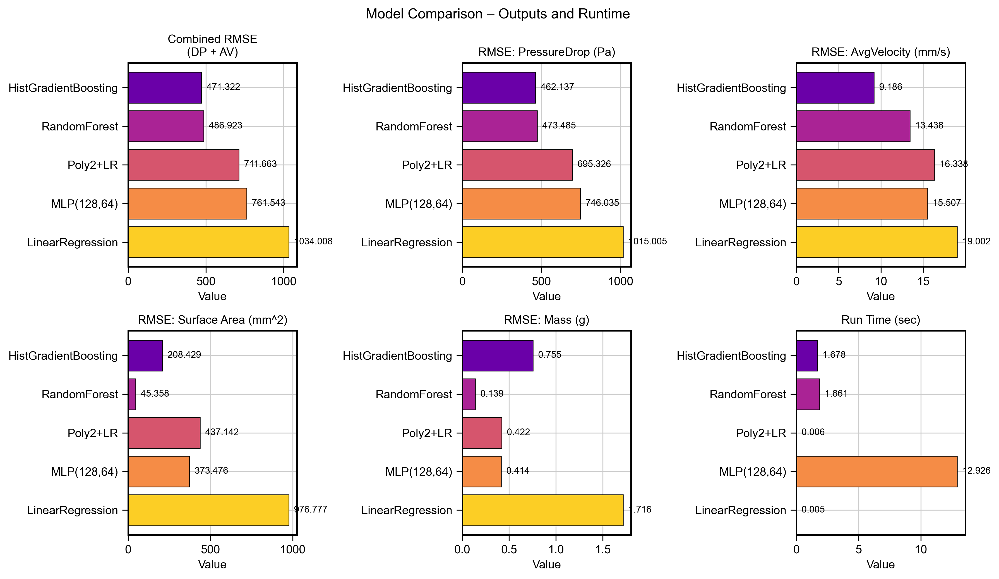

In [21]:
models  = test_table['Model'].values
metrics = {
    "Combined RMSE\n(DP + AV)":    test_table['Test_Combined_RMSE'].values,
    "RMSE: PressureDrop":          test_table['RMSE_PressureDrop'].values,
    "RMSE: AvgVelocity":           test_table['RMSE_AvgVelocity'].values,
    "RMSE: Surface Area":          test_table['RMSE_SurfaceArea'].values,
    "RMSE: Mass":                  test_table['RMSE_Mass'].values,
    "Run Time (sec)":              test_table['RunTime_sec'].values,
}


fig, axes = plt.subplots(2, 3, figsize=(12, 7), squeeze=False)
ax_list = axes.ravel()

for i, (title, vals) in enumerate(metrics.items()):
    ax = ax_list[i]
    colors = [plt.cm.plasma(v) for v in np.linspace(0.2, 0.9, len(models))]
    ax.barh(models, vals, color=colors, edgecolor='black', linewidth=0.6)
    ax.invert_yaxis()
    ax.set_title(title)
    ax.set_xlabel("Value")

    for yi, v in enumerate(vals):
        ax.text(v, yi, f"  {v:.3f}", va='center', fontsize=8, color='black')

fig.suptitle("Model Comparison – Outputs and Runtime", y=0.98)
plt.tight_layout()
plt.show()

## Residual Errors Plots-Evaluating the Best Model's Performance

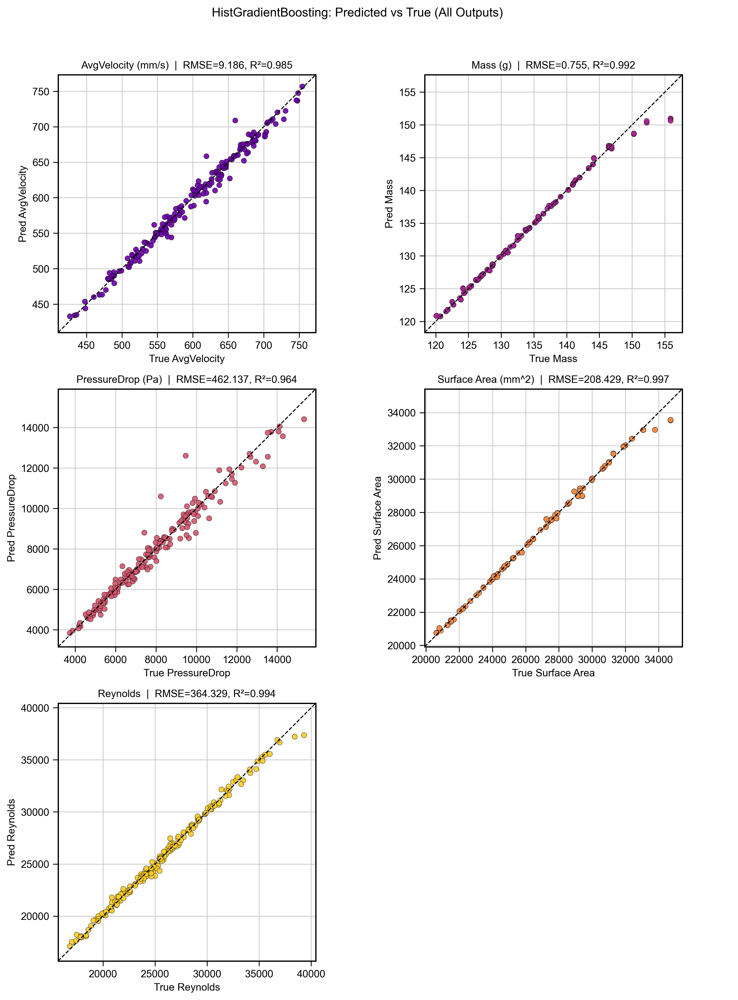

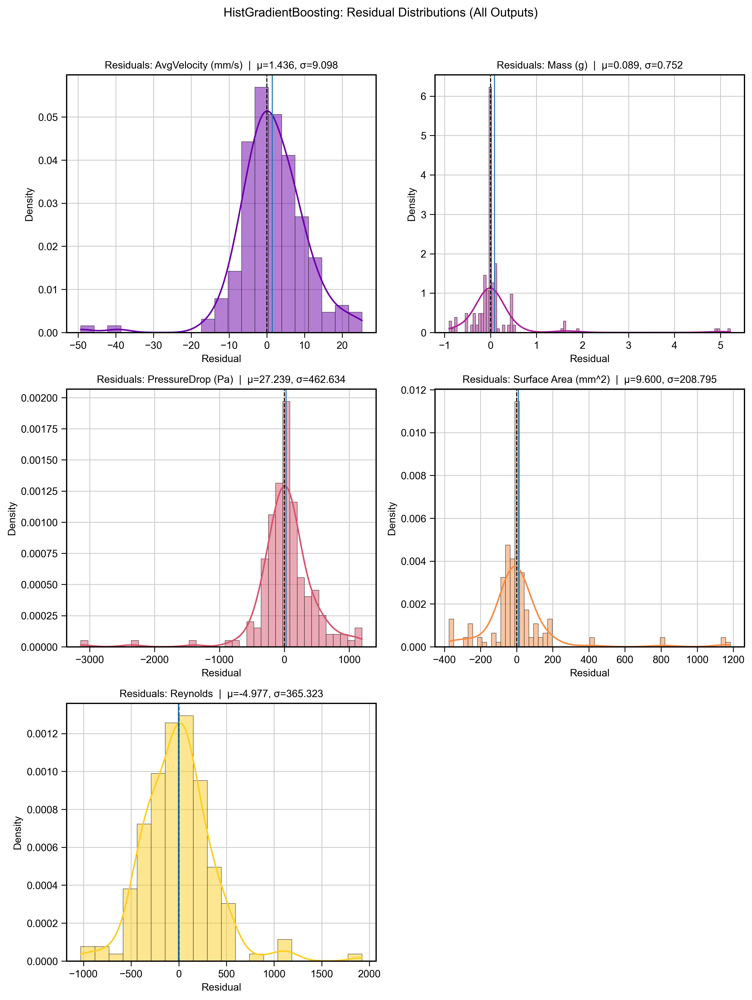

In [22]:
from math import ceil
from sklearn.metrics import r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def _grid(n_panels, max_cols=2):
    cols = min(max_cols, n_panels) if n_panels > 1 else 1
    rows = int(ceil(n_panels / cols))
    return rows, cols

def _lims_equal(x, y, pad=0.05):
    lo = float(min(np.min(x), np.min(y)))
    hi = float(max(np.max(x), np.max(y)))
    span = hi - lo if hi > lo else 1.0
    lo -= pad * span
    hi += pad * span
    return lo, hi

def plot_pred_true_all(y_true, y_pred, target_names, model_name, max_cols=2):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    n = len(target_names)
    rows, cols = _grid(n, max_cols=max_cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5.2*cols, 4.4*rows), squeeze=False)

    colors = [plt.cm.plasma(v) for v in np.linspace(0.2, 0.9, n)]
    for i, t in enumerate(target_names):
        r, c = divmod(i, cols)
        ax = axes[r][c]
        j = targets.index(t)

        x = y_true[:, j]; y = y_pred[:, j]
        rmse = float(np.sqrt(np.mean((y - x)**2)))
        r2   = float(r2_score(x, y))

        lo, hi = _lims_equal(x, y)
        ax.scatter(x, y, s=26, edgecolor='black', linewidths=0.3, alpha=0.9, color=colors[i])
        ax.plot([lo, hi], [lo, hi], ls='--', color='black', lw=1.0)
        ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel(f"True {t}")
        ax.set_ylabel(f"Pred {t}")
        ax.set_title(f"{t}  |  RMSE={rmse:.3f}, R²={r2:.3f}")

    for j in range(n, rows*cols):
        r, c = divmod(j, cols)
        axes[r][c].axis('off')

    fig.suptitle(f"{model_name}: Predicted vs True (All Outputs)", y=1.02)
    fig.tight_layout()
    plt.show()

def plot_residuals_all(y_true, y_pred, target_names, model_name, max_cols=2):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    n = len(target_names)
    rows, cols = _grid(n, max_cols=max_cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5.2*cols, 4.4*rows), squeeze=False)

    colors = [plt.cm.plasma(v) for v in np.linspace(0.2, 0.9, n)]
    for i, t in enumerate(target_names):
        r, c = divmod(i, cols)
        ax = axes[r][c]
        j = targets.index(t)

        resid = y_true[:, j] - y_pred[:, j]
        mu, sigma = float(np.mean(resid)), float(np.std(resid, ddof=1))

        sns.histplot(resid, kde=True, stat="density", edgecolor='black', linewidth=0.3,
                     color=colors[i], ax=ax)
        ax.axvline(0.0, ls='--', lw=1.0, color='black')
        ax.axvline(mu, ls='-', lw=1.0)
        ax.set_title(f"Residuals: {t}  |  μ={mu:.3f}, σ={sigma:.3f}")
        ax.set_xlabel("Residual (True − Pred)")
        ax.set_ylabel("Density")


    for j in range(n, rows*cols):
        r, c = divmod(j, cols)
        axes[r][c].axis('off')

    fig.suptitle(f"{model_name}: Residual Distributions (All Outputs)", y=1.02)
    fig.tight_layout()
    plt.show()

# --- Use with the selected best model ---
Yp_best = best_model.predict(X_test)
plot_pred_true_all(Y_test.values, Yp_best, targets, best_model_name, max_cols=2)
plot_residuals_all(Y_test.values, Yp_best, targets, best_model_name, max_cols=2)


## Feature importance for tree-based models
Interpretability—identify which inputs most influence predictions in non-linear tree models.


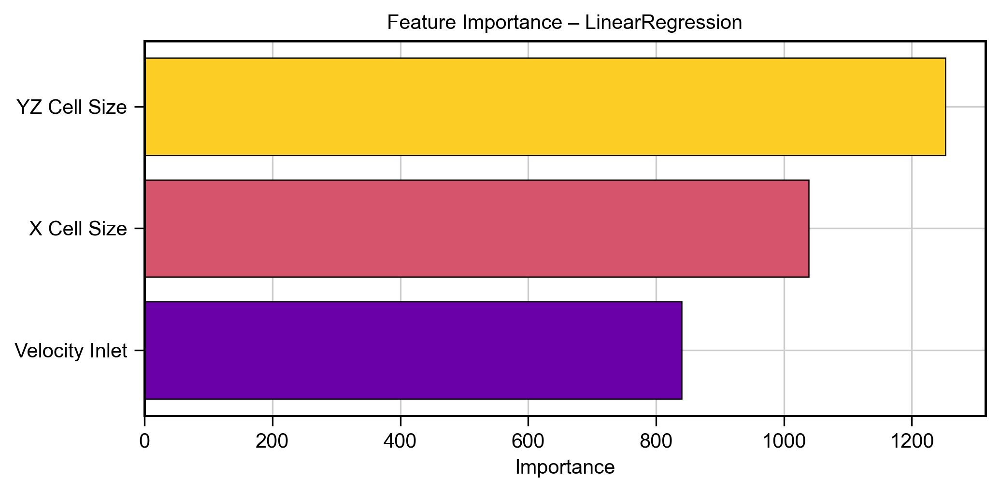

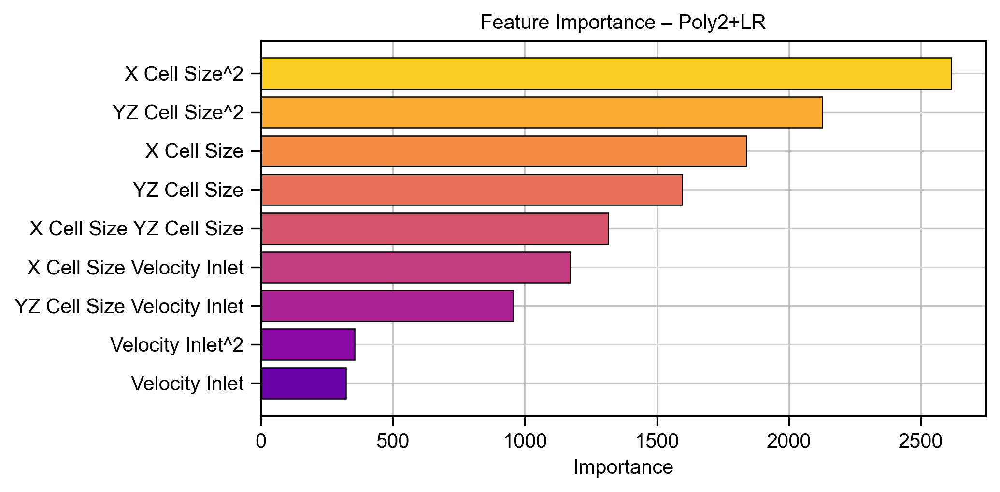

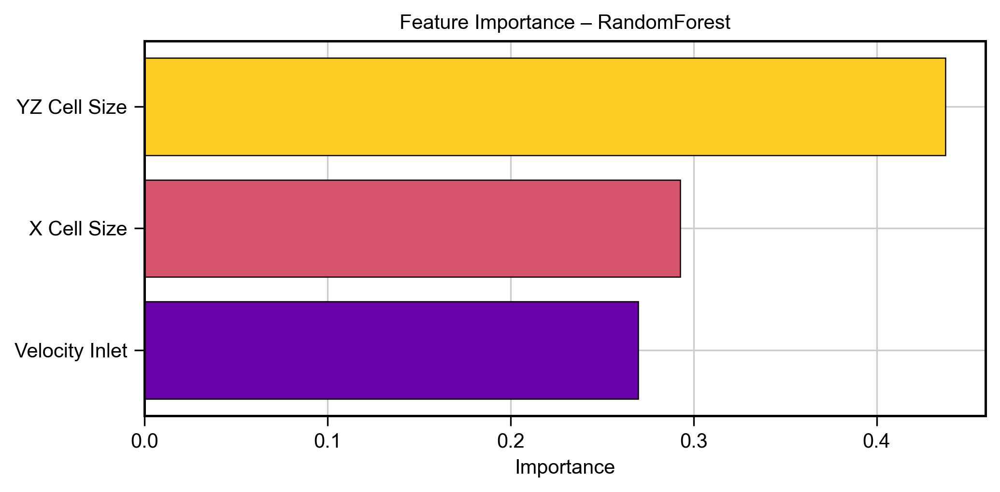

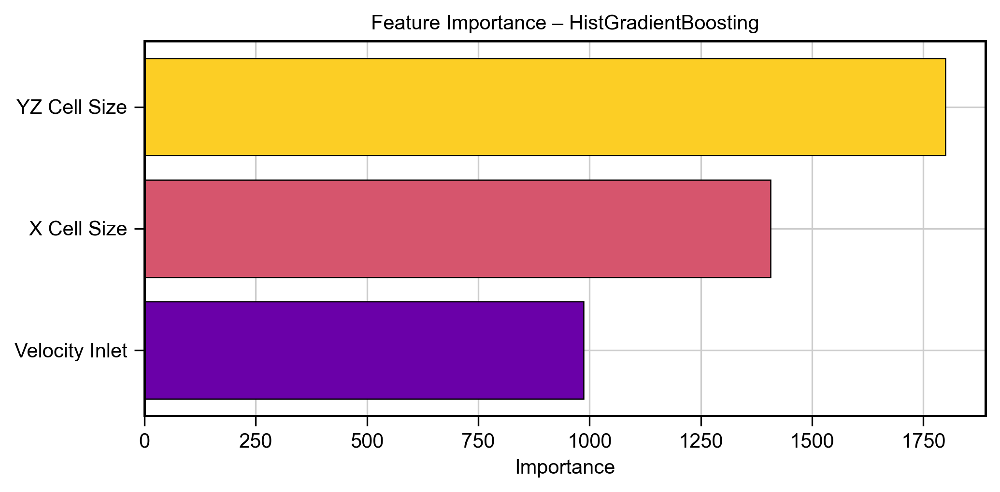

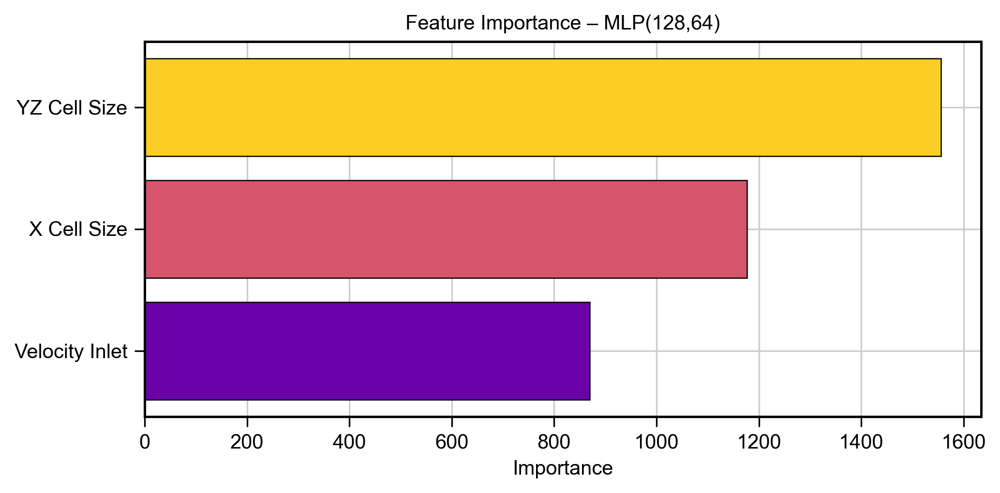

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, make_scorer


try:
    plasma_cmap
except NameError:
    plasma_cmap = plt.cm.plasma

def _avg_rmse_across_outputs(y_true, y_pred):
    yt = np.asarray(y_true)
    yp = np.asarray(y_pred)
    rmses = [np.sqrt(mean_squared_error(yt[:, j], yp[:, j])) for j in range(yt.shape[1])]
    return float(np.mean(rmses))

_rmse_scorer = make_scorer(_avg_rmse_across_outputs, greater_is_better=False)

def _final_estimator(model):

    if isinstance(model, Pipeline):
        return model.steps[-1][1]
    return model

def _poly_feature_names(pipeline, base_feature_names):

    try:
        from sklearn.preprocessing import PolynomialFeatures
    except Exception:
        return base_feature_names
    poly = None
    for name, step in pipeline.steps:
        if isinstance(step, PolynomialFeatures):
            poly = step
            break
    if poly is None:
        return base_feature_names
    try:

        return poly.get_feature_names_out(input_features=base_feature_names)
    except Exception:

        return base_feature_names

def _get_feature_matrix_names(model, feature_names):
    if isinstance(model, Pipeline):
        return _poly_feature_names(model, np.array(feature_names))
    return np.array(feature_names)

def _intrinsic_tree_importance(model):
    """
    Return (importances or None). Handles MultiOutputRegressor of tree models by averaging.
    """
    est = _final_estimator(model)

    if hasattr(est, "feature_importances_"):
        return est.feature_importances_
    if isinstance(est, MultiOutputRegressor):
        imps = []
        for sub in est.estimators_:
            if hasattr(sub, "feature_importances_"):
                imps.append(sub.feature_importances_)
        if len(imps):
            return np.mean(np.vstack(imps), axis=0)
    return None

def _intrinsic_linear_importance(model):
    """
    Return (abs(coeff) averaged across outputs) or None.
    Handles LinearRegression possibly wrapped in MultiOutputRegressor and/or Pipeline.
    """

    est = _final_estimator(model)

    if isinstance(est, MultiOutputRegressor):
        coefs = []
        for sub in est.estimators_:
            if hasattr(sub, "coef_"):
                c = sub.coef_.ravel()
                coefs.append(np.abs(c))
        if coefs:
            return np.mean(np.vstack(coefs), axis=0)
        return None

    if hasattr(est, "coef_"):
        c = est.coef_

        if c.ndim == 2:
            return np.mean(np.abs(c), axis=0)
        return np.abs(c.ravel())
    return None

def plot_feature_importance_any(model, model_name, X_train, X_test, Y_test, feature_names,
                                n_repeats=25, random_state=42):
    """
    Try intrinsic importances first (trees, linear). If not available, use permutation importance.
    Plots Plasma-colored horizontal bars.
    """

    work_feat_names = _get_feature_matrix_names(model, feature_names)


    imp = _intrinsic_tree_importance(model)
    source = None
    if imp is not None:
        source = "tree_importance"


    if imp is None:
        imp = _intrinsic_linear_importance(model)
        if imp is not None:
            source = "linear_coefficients(|coef|)"


    if imp is None:
        perm = permutation_importance(
            model, X_test, Y_test,
            scoring=_rmse_scorer,
            n_repeats=n_repeats,
            random_state=random_state,
            n_jobs=-1
        )
        imp = np.abs(perm.importances_mean)
        source = "permutation_importance"


    imp = np.asarray(imp).ravel()
    if len(imp) != len(work_feat_names):

        m = min(len(imp), len(work_feat_names))
        imp = imp[:m]
        work_feat_names = work_feat_names[:m]

    order = np.argsort(imp)
    labels = np.array(work_feat_names)[order]
    vals   = imp[order]
    colors = [plasma_cmap(v) for v in np.linspace(0.2, 0.9, len(labels))]

    plt.figure(figsize=(7.0, max(3.5, 0.35*len(labels))))
    plt.barh(labels, vals, color=colors, edgecolor='black', linewidth=0.6)
    plt.title(f"Feature Importance – {model_name}")
    plt.xlabel("Importance")
    plt.tight_layout()
    plt.show()

for mname, mdl in fitted_models.items():
    try:
        plot_feature_importance_any(mdl, mname, X_train, X_test, Y_test, features)
    except Exception as e:
        print(f"[WARN] Could not compute feature importance for {mname}: {e}")


**It was found that "YZ Cell Size" is the most input feature for all ML models, therefore in the next step of the data augmentation, the range of this input was changed for consideration of different cases**

**Explanation for data augmentation:**

Latin Hypercube Sampling (LHS) was utilized to generate well-distributed design points. The sampling considered 15 discrete levels for YZ Cell Size and Inlet Velocity, and 5 discrete levels for X Cell Size. These levels were defined according to the target parameter correlations to represent the design space adequately.

# Final Evaluation and Optimal Design

In [ ]:

import numpy as np
import pandas as pd
from scipy.stats import qmc
import warnings


warnings.filterwarnings("ignore", message="delta_grad == 0.0", category=UserWarning)

idx = {t: i for i, t in enumerate(targets)}

lb = np.array([10.0, 10.0, 2500.0], dtype=float)   
ub = np.array([25.0, 25.0, 3500.0], dtype=float)

def _batch_predict(Xbatch):
    df = pd.DataFrame(Xbatch, columns=features)
    Y = best_model.predict(df)
    return np.asarray(Y)

def _is_feasible(Y):
    return (
        (Y[:, idx['Mass']] < 125.0) &
        (Y[:, idx['PressureDrop']] < 8000.0) &
        (Y[:, idx['AvgVelocity']] > 520.0)
    )

def _penalty(Y):
    # Normalized violation 
    p_mass = np.maximum(Y[:, idx['Mass']] - 125.0, 0.0) / 125.0
    p_dp   = np.maximum(Y[:, idx['PressureDrop']] - 8000.0, 0.0) / 8000.0
    p_av   = np.maximum(520.0 - Y[:, idx['AvgVelocity']], 0.0) / 520.0
    return p_mass + p_dp + p_av

def _clip_bounds(lo, hi):
    return np.maximum(lo, lb), np.minimum(hi, ub)

def lhs_optimize_surface_area(n0=8000, rounds=3, shrink=0.35, seed=42):
    """
    Progressive LHS:
      - sample n0 points in the full box
      - take best feasible Surface Area
      - zoom bounds around the current best by factor `shrink`
      - repeat `rounds` times
    Returns (x_best, y_best, feasible_flag).
    """
    rng = np.random.RandomState(seed)
    current_lb, current_ub = lb.copy(), ub.copy()

    best_x = None
    best_y = None
    best_sa = -np.inf

    for r in range(rounds):
        n = int(n0)  
        sampler = qmc.LatinHypercube(d=3, seed=rng.randint(0, 10**6))
        U = sampler.random(n)                
        X = qmc.scale(U, current_lb, current_ub)

        Y = _batch_predict(X)
        feas = _is_feasible(Y)

        if feas.any():
            
            SA = Y[:, idx['Surface Area']]
            SA_feas = SA.copy()
            SA_feas[~feas] = -np.inf
            i = int(np.argmax(SA_feas))
            if SA_feas[i] > best_sa:
                best_sa = SA_feas[i]
                best_x = X[i].copy()
                best_y = Y[i].copy()

           
            center = best_x if best_x is not None else X[i]
            half_span = (current_ub - current_lb) * shrink * 0.5
            new_lb = center - half_span
            new_ub = center + half_span
            current_lb, current_ub = _clip_bounds(new_lb, new_ub)
        else:
           
            P = _penalty(Y)
            j = int(np.argmin(P))
            center = X[j]
            half_span = (current_ub - current_lb) * shrink * 0.5
            new_lb = center - half_span
            new_ub = center + half_span
            current_lb, current_ub = _clip_bounds(new_lb, new_ub)

    return best_x, best_y, (best_x is not None)

# ---- run optimizer ----
x_opt, y_opt, ok = lhs_optimize_surface_area(n0=10000, rounds=3, shrink=0.30, seed=42)

if ok:
    out = dict(zip(targets, y_opt))
    print("Optimal inputs [X, YZ, Velocity]:", x_opt)
    print("Predicted outputs:", out)

    # Feasibility margins (positive = safe)
    m_mass = 125.0  - out['Mass']
    m_dp   = 8000.0 - out['PressureDrop']
    m_av   = out['AvgVelocity'] - 520.0
    print("\nConstraint margins:")
    print(f"  Mass        : {m_mass:.3f} (g over safety)")
    print(f"  PressureDrop: {m_dp:.3f} (Pa under limit)")
    print(f"  AvgVelocity : {m_av:.3f} (mm/s over minimum)")
else:
    print("No feasible point found via sampling. Consider increasing n0 or rounds.")



Optimal inputs [X, YZ, Velocity]: [  23.68283112   20.62336284 2937.68471745]
Predicted outputs: {'AvgVelocity': 523.4265370275026, 'Mass': 123.41131362469147, 'PressureDrop': 5276.891657112887, 'Surface Area': 22929.0813128487, 'Reynolds': 30250.60348022504}

Constraint margins:
  Mass        : 1.589 (g over safety)
  PressureDrop: 2723.108 (Pa under limit)
  AvgVelocity : 3.427 (mm/s over minimum)


In [25]:
import pickle
import numpy as np
import pandas as pd

BEST_MODEL_PKL = "best_model.pkl"

try:
    best_model
    best_model_name
except NameError:
    with open(BEST_MODEL_PKL, "rb") as f:
        obj = pickle.load(f)
    best_model = obj["model"]
    best_model_name = obj["model_name"]
    features = obj["features"]
    targets = obj["targets"]

print(f"\nLoaded model: {best_model_name}")


BOUNDS = {
    "X Cell Size":      (10.0, 25.0),
    "YZ Cell Size":     (10.0, 25.0),
    "Velocity Inlet":   (2500.0, 3500.0),  # mm/s
}

def _ask_float(prompt, lo, hi):
    while True:
        try:
            v = float(input(f"{prompt} [{lo}..{hi}]: ").strip())
            if np.isnan(v):
                raise ValueError
            return v
        except Exception:
            print("  ✗ Invalid number. Try again.")

def _clip(v, lo, hi):
    return min(max(v, lo), hi)

print("\nEnter design inputs (values will be clipped to valid ranges):")
x_val = _ask_float("X Cell Size (mm)", *BOUNDS["X Cell Size"])
yz_val = _ask_float("YZ Cell Size (mm)", *BOUNDS["YZ Cell Size"])
vin_val = _ask_float("Velocity Inlet (mm/s)", *BOUNDS["Velocity Inlet"])


vals_raw = {"X Cell Size": x_val, "YZ Cell Size": yz_val, "Velocity Inlet": vin_val}
vals = {k: _clip(v, *BOUNDS[k]) for k, v in vals_raw.items()}
for k in vals:
    if vals[k] != vals_raw[k]:
        print(f"  ⚠ {k} clipped to {vals[k]} (was {vals_raw[k]})")


X_user = pd.DataFrame([[vals["X Cell Size"], vals["YZ Cell Size"], vals["Velocity Inlet"]]], columns=features)
y_pred = np.asarray(best_model.predict(X_user)).reshape(1, -1)[0]
pred = dict(zip(targets, y_pred))

print("\n=== Prediction (model: {}) ===".format(best_model_name))
print(f"Inputs:  X={vals['X Cell Size']:.3f} mm, YZ={vals['YZ Cell Size']:.3f} mm, V_in={vals['Velocity Inlet']:.3f} mm/s")
print("Outputs:")
print(f"  PressureDrop   : {pred['PressureDrop']:.3f}")
print(f"  AvgVelocity    : {pred['AvgVelocity']:.3f}")
print(f"  Surface Area   : {pred['Surface Area']:.3f}")
print(f"  Mass           : {pred['Mass']:.3f}")


ok_mass = pred['Mass'] < 125.0
ok_dp   = pred['PressureDrop'] < 8000.0
ok_va   = pred['AvgVelocity'] > 520.0

print("\nFeasibility against constraints (Mass<125 g, ΔP<8000, Vavg>520):")
print(f"  Mass         : {'OK' if ok_mass else 'FAIL'}  (value={pred['Mass']:.3f}, margin={125.0 - pred['Mass']:.3f})")
print(f"  PressureDrop : {'OK' if ok_dp   else 'FAIL'}  (value={pred['PressureDrop']:.3f}, margin={8000.0 - pred['PressureDrop']:.3f})")
print(f"  AvgVelocity  : {'OK' if ok_va   else 'FAIL'}  (value={pred['AvgVelocity']:.3f}, margin={pred['AvgVelocity'] - 520.0:.3f})")


Loaded model: HistGradientBoosting

Enter design inputs (values will be clipped to valid ranges):

=== Prediction (model: HistGradientBoosting) ===
Inputs:  X=12.000 mm, YZ=18.000 mm, V_in=3100.000 mm/s
Outputs:
  PressureDrop   : 9321.432
  AvgVelocity    : 643.274
  Surface Area   : 26408.771
  Mass           : 134.152

Feasibility against constraints (Mass<125 g, ΔP<8000, Vavg>520):
  Mass         : FAIL  (value=134.152, margin=-9.152)
  PressureDrop : FAIL  (value=9321.432, margin=-1321.432)
  AvgVelocity  : OK  (value=643.274, margin=123.274)
